In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as mp
from sklearn.utils import resample
import re as r
from nltk.stem import PorterStemmer

In [2]:
df=pd.read_csv("FinalDataset.csv")

## Data Overview

In [3]:
df.head()

,Text,Status
0,"am both shocked, and feeling like I should ha...",Depression
1,anjayy new emoticon,Normal
2,Anyone feeling a bit lost in their teens-30s ...,Depression
3,Attempt at a meme,Depression
4,had a great lunch with daughter and grandchil...,happy


In [4]:
df["Status"].value_counts()

Status
Depression    6014
Suicidal      5638
Normal        3682
happy         3667
Name: count, dtype: int64

In [5]:
df['Status'].unique()

array(['Depression', 'Normal', 'happy', 'Suicidal'], dtype=object)

In [6]:
df.isna().sum()

Text      0
Status    0
dtype: int64

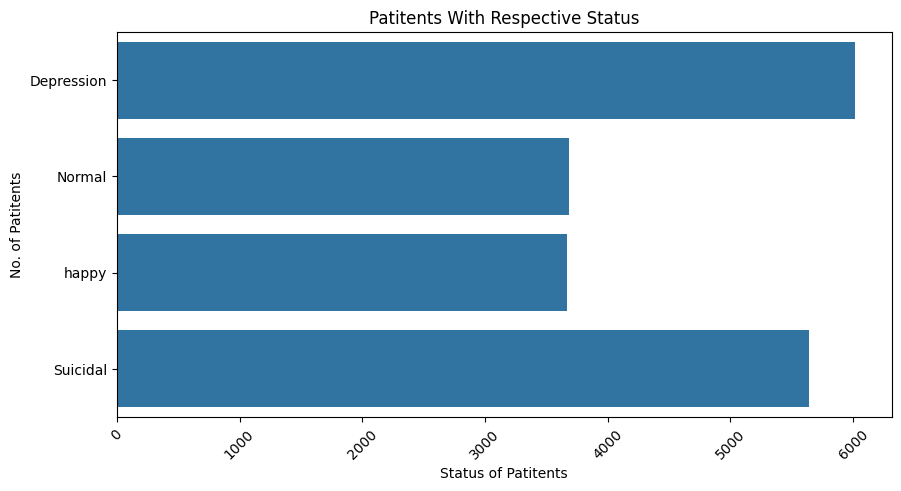

In [7]:
mp.figure(figsize=(10,5))
sns.countplot(df['Status'])
mp.xlabel("Status of Patitents")
mp.ylabel("No. of Patitents")
mp.title("Patitents With Respective Status")
mp.xticks(rotation=45)
mp.show()

## Resampling and Preprocessing 


In [8]:
max_count=df['Status'].value_counts().max()
max_count

6014

In [9]:
def resmpl(df):
    max_count = df['Status'].value_counts().max()

    df_resampled = pd.DataFrame()
    
    for status in df['Status'].unique():
        df_class = df[df['Status'] == status]
        if len(df_class) < max_count:
            df_class_resampled = resample(df_class, 
                                          replace=True,    
                                          n_samples=max_count,    
                                          random_state=42)   
            df_resampled = pd.concat([df_resampled, df_class_resampled])
        else:
            df_resampled = pd.concat([df_resampled, df_class])
    
    return df_resampled


df = resmpl(df)

In [10]:
df.sample(5)

,Text,Status
14450,need to study for quant and do legal process a...,Normal
13177,Literally want to die so bad.... I have no fri...,Suicidal
17830,We played a game together earlier today and ha...,happy
1524,"Currently, I do not have anyone in my life I f...",Suicidal
3532,"His name is 2and900, and 2 nights ago killed h...",Suicidal


In [11]:
df.Status.value_counts()

Status
Depression    6014
Normal        6014
happy         6014
Suicidal      6014
Name: count, dtype: int64

In [12]:
df.shape

(24056, 2)

In [13]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 24056 entries, 0 to 16010
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   Text    24056 non-null  object
 1   Status  24056 non-null  object
dtypes: object(2)
memory usage: 563.8+ KB


In [14]:
df.duplicated().sum()

9363

In [15]:
import nltk
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
def preprocessing1(s):
    example_sent = s
    print(example_sent)
    example_sent = example_sent.replace(r'[^\w\s]+,', '')
    stop_words = set(stopwords.words('english'))
    list_contractions_common = {'arent', 'cant', 'couldnt', 'didnt', 'doesnt', 'hadnt', 'havent', 'shouldnt', 'wouldnt', 'youve','youre','wont','werent', 'weve','wed', 'theyre', 'Im', 'its','yesterday'}
    stop_words.update(list_contractions_common)

    word_tokens = word_tokenize(example_sent)

    #print(word_tokens)
    # converts the words in word_tokens to lower case and then checks whether 
    #they are present in stop_words or not
    filtered_sentence = [w for w in word_tokens if not w.lower() in stop_words]
    #with no lower case conversion
    filtered_sentence = []


    for w in word_tokens:
        if w not in stop_words:
            filtered_sentence.append(w)

    filtered_sentence = ' '.join(filtered_sentence)
    #print(filtered_sentence)

    final_sentence = filtered_sentence
    #filtered_sentence = TextBlob(filtered_sentence)
    #filtered_sentence = str(filtered_sentence.correct())

    print(filtered_sentence)
    return filtered_sentence

In [16]:
df['Text']=df['Text'].apply(preprocessing1)

 am both shocked, and feeling like I should have already realized it.I am who he is talking about. I am not brave enough to save everyone around me and jump off a fucking bridge, but I wish I were. It just shows me another reason I should hate myself, and reminds me that I do not deserve life. While I am alive, others suffer.I wish I could just kill myself. It really would be the right thing to do. Holy shit. This is me.
shocked , feeling like I already realized it.I talking . I brave enough save everyone around jump fucking bridge , I wish I . It shows another reason I hate , reminds I deserve life . While I alive , others suffer.I wish I could kill . It really would right thing . Holy shit . This .
 Anyone feeling a bit lost in their teens-30s watch this
Anyone feeling bit lost teens-30s watch
 Attempt at a meme
Attempt meme
- I am just so tired lolits a chore to even take care of myself- the bad days outweigh the good days- the heaviness i feel is suffocating - i feel like my soul i

In [17]:
df.to_csv('PreprocessedDataset.csv', index=False)